# Load data

In [1]:
import shutil
from google.colab import drive
drive.mount("/content/drive")
shutil.copy("/content/drive/MyDrive/Colab Notebooks/PDL/CocoDataset.zip", "/content")
!unzip -qq 'CocoDataset.zip'

Mounted at /content/drive


# Create dataset

In [2]:
from torch.utils.data import Dataset
import albumentations as A
import torchvision.transforms as T
import cv2
import os
import yaml
from typing import Literal, Any, Union
from tqdm import tqdm
import json
import torch
import numpy as np

In [3]:
class LoadDataset(Dataset):
    def __init__(self,
                 stage: Literal["train", "val"],
                 config_path: str,
                 transforms: Union[A.Compose, T.Compose] = None,
                 image_size = 512, normalized_coords:bool = False,
                 *args, **kwargs
                 ):

        self.normalized_coords = normalized_coords
        self.config = self.load_config(config_path)
        self.images_dirpath = None
        self.labels_dirpath = None
        self.__define_paths(stage)

        self.names = self.config["names"]
        self.num_classes = len(self.names)
        self.samples = os.listdir(self.labels_dirpath)

        if transforms:
            self.bbox_params = A.BboxParams(format="pascal_voc", label_fields= ["category_id"])
            self.transforms = A.Compose(transforms, bbox_params=self.bbox_params)
        else: self.transforms = None

    @staticmethod
    def load_config(path: str) -> dict:
        with open(path, mode="r") as f:
            data = yaml.load(stream=f, Loader=yaml.SafeLoader)
        return data

    def __len__(self) -> int:
        return len(self.samples)

    def __getitem__(self, idx: int) -> tuple[torch.Tensor, dict]:
        filename = self.samples[idx].split(".")[0]
        paths = self._get_paths(filename)
        image = cv2.imread(paths["image"], cv2.COLOR_BGR2RGB)
        target = self._get_target(paths["label"])
        target["image_id"] = torch.tensor(idx)
        if self.transforms:
            image, target = self.transform(image, target)

        image_size = image.shape
        image_meta = {'image_shape': (image_size[1], image_size[2], image_size[0]),
                      'batch_input_shape': (image_size[1], image_size[2]),
                      'scale_factor': (1.0, 1.0),
                      'ori_shape': (image_size[1], image_size[2], image_size[0])}

        return image, target, image_meta

    def transform(self, image: np.ndarray, target: dict) -> tuple[torch.Tensor, dict]:
        transformed = self.transforms(
            image=image, masks=target["masks"],
            bboxes=target["boxes"],
            category_id=target["labels"]
        )
        image = transformed["image"]
        target["masks"] = torch.as_tensor(
            np.array(list(map(np.array, transformed["masks"])), dtype=np.uint8)
        )

        target["labels"] = torch.tensor(transformed["category_id"])
        target["boxes"] = torch.as_tensor(transformed["bboxes"], dtype=torch.float32)
        return image, target

    def __define_paths(self, stage: Literal["train", "val"]) -> None:
        data_dirpath = self.config[stage]
        self.images_dirpath = os.path.join(data_dirpath, "images")
        self.labels_dirpath = os.path.join(data_dirpath, "labels")

    def _get_paths(self, filename: str) -> dict:
        image_path = os.path.join(self.images_dirpath, f"{filename}.tif")
        label_path = os.path.join(self.labels_dirpath, f"{filename}.txt")
        return {
            "image": image_path,
            "label": label_path
        }

    @staticmethod
    def _get_target_sample() -> dict:
        return {
            "image_id": None,
            "boxes": [],
            "masks": [],
            "labels": [],
            "target":[]
        }

    def _get_target(self, annotations_path: str) -> dict:
        target = self._get_target_sample()

        with open(annotations_path, "r") as file:
            for line in file:
                label = int(line[0])
                coordinates = np.array(list(map(int,
                                line[1:].split()))).reshape(1, -1, 2)
                #print(coordinates)
                mask = self.__get_mask(label, coordinates)
                box = self.__get_box(mask)
                target["masks"].append(mask)
                target["boxes"].append(box)
                target["labels"].append(label)

        return target

    @staticmethod
    def __get_mask(label: int, coordinates: np.ndarray) -> np.ndarray:
        mask = np.zeros((512, 512), dtype=np.uint8)
        #colors = [(1,0,0), (0,1,0), (0,0,1)]
        return cv2.fillPoly(
            mask, pts=coordinates,
            color=(label+1, label+1, label+1)
        )

    @staticmethod
    def __get_box(mask: np.ndarray) -> list[np.ndarray, ...]:
        pos = np.nonzero(mask)
        xmin = np.min(pos[1])
        xmax = np.max(pos[1])
        ymin = np.min(pos[0])
        ymax = np.max(pos[0])
        return [xmin, ymin, xmax, ymax]

In [4]:
def collate_fn(data):
    """
       data: is a list of tuples with (example, label, length)
             where 'example' is a tensor of arbitrary shape
             and label/length are scalars
    """
    images, targets, meta = zip(*data)
    batch_images = []
    batch_images.extend([image.unsqueeze(0) for image in images])

    targets = [item[1] for item in data]
    meta = [item[2] for item in data]

    num = 0
    gt_data = []
    for target in targets:
      ind = torch.tensor([num])
      gt_data.append(torch.stack([torch.cat([ind, target['labels'][i].view(1),
                                             target['boxes'][i]]) for i in range(len(target['labels']))]))
      num += 1


    return torch.cat(batch_images, 0), target, meta, torch.cat(gt_data, dim=0)

## data transforms

In [5]:
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

In [6]:
mean = [0.6304, 0.4166, 0.6862]
std = [0.1457, 0.1963, 0.1234]

train_transforms = [
    A.RandomSizedBBoxSafeCrop(width=384, height=384, erosion_rate=0.0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Normalize(mean=mean, std=std),
    ToTensorV2()
]

val_transforms = [
    A.RandomSizedBBoxSafeCrop(width=384, height=384, erosion_rate=0.0),
    A.Normalize(mean=mean, std=std),
    ToTensorV2()
]

# Model

In [7]:
!pip install timm==0.6.11
!git clone https://github.com/sail-sg/metaformer.git
!pip install openmim
!mim install "mmengine>=0.6.0"
!mim install "mmcv>=2.0.0rc4,<2.1.0"
!mim install "mmdet>=3.0.0rc6,<3.1.0"
!git clone https://github.com/open-mmlab/mmyolo.git
!pip install -r mmyolo/requirements/albu.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 548.7/548.7 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 31.4 MB/s eta 0:00:00
Cloning into 'metaformer'...
remote: Enumerating objects: 205, done.
remote: Counting objects: 100% (205/205), done.
remote: Compressing objects: 100% (86/86), done.
remote: Total 205 (delta 146), reused 173 (delta 118), pack-reused 0
Receiving objects: 100% (205/205), 364.53 KiB | 1.26 MiB/s, done.
Resolving deltas: 100% (146/146), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.2/289.2 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 20.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 502.3/502.3 kB 26.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.

Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 437.5/437.5 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.3/250.3 kB 12.5 MB/s eta 0:00:00
  Attempting uninstall: importlib-metadata
    Found existing installation: importlib-metadata 4.6.4
    Uninstalling importlib-metadata-4.6.4:
      Successfully uninstalled importlib-metadata-4.6.4
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.4/74.4 MB 10.3 MB/s eta 0:00:00
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 16.3 MB/s eta 0:00:00
Cloning into 'mmyolo'...
remote: Enumerating objects: 4917, done.
remote: Counting objects: 100% (309/309), done.
remote: Compressing objects: 100% (169/169), done.
remote: Total 4917 (delta 138), reused 257 (delta 13

In [8]:
import torch
import timm
import torch.nn as nn
from functools import partial
import torch.nn.functional as F
from metaformer import metaformer_baselines as mb

In [9]:
import sys
sys.path.append('/content/mmyolo')
from mmyolo.models import YOLOv8Head

In [10]:
from mmengine import ConfigDict
from mmengine.config import Config

In [11]:
class Conv(nn.Module):
  def __init__(self, dim_in, dim_out, kernel_size = 3, padding = 0):
    super().__init__()
    self.pre_permute = False
    if kernel_size == 1:
      self.conv = nn.Linear(dim_in, dim_out, bias=False)
    else:
      self.pre_permute = True
      self.conv = nn.Conv2d(dim_in, dim_out, kernel_size=kernel_size,
                        padding=padding, bias=False)

    self.normalization = nn.BatchNorm2d(dim_out)
    self.activation = nn.ReLU()

  def forward(self, input):
    if self.pre_permute:
      x = self.conv(input.permute(0,3,1,2))
    else:
      x = self.conv(input).permute(0,3,1,2)

    x = self.normalization(x).permute(0, 2, 3, 1)
    x = self.activation(x)
    return x

class Connector(nn.Module):
  def __init__(self, dim_in, dim_out):
    super().__init__()
    self.split_dim = dim_out//2
    self.pwconv1 = Conv(dim_in, dim_out, kernel_size = 1)
    self.dwconv1 = nn.Conv2d(self.split_dim, self.split_dim//2, kernel_size=3,
                        padding=1, bias=False)
    self.dwconv2 = nn.Conv2d(self.split_dim//2, self.split_dim, kernel_size=3,
                    padding=1, bias=False)
    self.pwconv2 = Conv(dim_out+self.split_dim, dim_out, kernel_size =1)

  def forward(self, input):
    x = self.pwconv1(input)
    x1, x2 = torch.split(x, self.split_dim, dim = 3)
    x = self.dwconv1(x2.permute(0,3,1,2))
    x = self.dwconv2(x).permute(0, 2, 3, 1)

    x = torch.cat([x1,x2,x], dim = 3)
    x = self.pwconv2(x)
    return x

class Convformer(nn.Module):
  def __init__(self, dim):
    super().__init__()
    self.norm1 = mb.LayerNormWithoutBias(dim, eps=1e-6)
    self.bnorm = nn.BatchNorm2d(dim)

    self.sepconv = mb.SepConv(dim, expansion_ratio=2,
        act1_layer=nn.ReLU6, act2_layer=nn.ReLU6,
        bias=False, kernel_size=3, padding='same')

    self.attention = mb.Attention(dim, head_dim=32, num_heads=None,
                                  qkv_bias=False, attn_drop=0.,
                                  proj_drop=0., proj_bias=False)

    self.MLP = mb.Mlp(dim, mlp_ratio=4, out_features=None,
                      act_layer=mb.StarReLU, drop=0., bias=False)

  def forward(self, input):
    x = self.norm1(input)
    x = self.sepconv(x)
    x = self.attention(x)
    x = x + input
    x = self.MLP(x)
    return x


class up(nn.Module):
  def __init__(self, scale, mode = 'nearest'):
    super().__init__()
    self.up = nn.Upsample(scale_factor=scale, mode=mode)
  def forward(self, input):
    return self.up(input.permute(0, 3, 1, 2)).permute(0, 2, 3, 1)


In [12]:
class FeatureExtractorV1(nn.Module):
    def __init__(self, in_channels = 3, num_classes = 1, dims = [64, 128, 320, 512]):
        super().__init__()
        self.in_channels = in_channels
        self.dims = dims
        backbone = mb.caformer_s18_384(pretrained=True)
        self.downsamples = list(backbone.children())[0]
        self.metaformers = list(backbone.children())[1]

        self.convfs = nn.ModuleList()
        for i in range(len(dims)):
            self.convfs.append(Convformer(dims[i]))

        self.connector_3_0 = Connector(dims[3],dims[3])

        self.connector_2_0 = Connector(dims[3],dims[2])
        self.connector_2_1 = Connector(2*dims[2],dims[2])

        self.connector_1_0 = Connector(dims[2],dims[1])
        self.connector_1_1 = Connector(2*dims[1],dims[1])

        self.connector_0_0 = Connector(dims[1],dims[0])
        self.connector_0_1 = Connector(2*dims[0],dims[0])

        self.connector_final = Connector(dims[0]//2, dims[0]//2)

        self.up2 = up(2, mode = 'bilinear')
        self.up4 = up(4, mode = 'bilinear')

    def forward(self, input):
        skips = []
      # Encoding
        x = input
        for i in range(len(self.dims)):
            x = self.metaformers[i](self.downsamples[i](x))
            if i < len(self.dims)-1:
                skips.append(x + self.convfs[i](x))
            else:
                x = x + self.convfs[i](x)

        # Decoder level 0: upsample_feature_0: 512 -> 512 | x: 512 -> 320
        con3 = self.connector_3_0(x)
        x = self.connector_2_0(self.up2(x))
        x = torch.cat([skips[2], x], dim = 3)
        con2 = self.connector_2_1(x)
        ####
        x = self.connector_1_0(self.up2(con2))
        x = torch.cat([skips[1], x], dim = 3)
        con1 = self.connector_1_1(x)
        ####
        x = self.connector_0_0(self.up2(con1))
        x = torch.cat([skips[0], x], dim = 3)
        con0 = self.connector_0_1(x)
        ### Head
        return con1.permute(0, 3, 1, 2), con2.permute(0, 3, 1, 2), con3.permute(0, 3, 1, 2)

In [13]:
class FeatureExtractorV2(nn.Module):
    def __init__(self, in_channels = 3, num_classes = 3, dims = [64, 128, 320, 512]):
        super().__init__()
        self.in_channels = in_channels
        self.dims = dims

        ###
        backbone = mb.caformer_s18_384(pretrained=True)
        self.downsamples = list(backbone.children())[0]
        self.metaformers = list(backbone.children())[1]

        self.convfs = nn.ModuleList()
        for i in range(len(dims)):
          self.convfs.append(Convformer(dims[i]))

        self.connector_2_1 = Connector(dims[3]+dims[2],dims[2])
        self.connector_1_1 = Connector(dims[2]+dims[1],dims[1])
        self.connector_0_1 = Connector(dims[1]+dims[0],dims[0])

        self.up2 = up(2, mode = 'bilinear')
        self.up4 = up(4, mode = 'bilinear')

    def forward(self, input):
      skips = []
      # Encoding
      x = input
      for i in range(len(self.dims)):
        x = self.metaformers[i](self.downsamples[i](x))
        if i < len(self.dims)-1:
          skips.append(x + self.convfs[i](x))
        else:
          x = x + self.convfs[i](x)

      #
      x = torch.cat([skips[2], self.up2(x)], dim = 3)
      con2 = self.connector_2_1(x)
      ####
      x = torch.cat([skips[1], self.up2(con2)], dim = 3)
      con1 = self.connector_1_1(x)
      ####
      x = torch.cat([skips[0], self.up2(con1)], dim = 3)
      con0 = self.connector_0_1(x)
      ### Head
      return con0.permute(0, 3, 1, 2), con1.permute(0, 3, 1, 2), con2.permute(0, 3, 1, 2)

In [14]:
class MetaFormerYolo(nn.Module):
    def __init__(self, in_channels:int = 3, num_classes:int = 3, state = "train"):
        super().__init__()
        # feature extractor
        self.state = state
        self.feature_extractor = FeatureExtractorV1(in_channels = in_channels,
                                                num_classes = num_classes)

        feature_shapes = [128, 320, 512]
        featmap_strides = [8, 16, 32]
        ### Yolov8Head
        self.head_module = dict(type='YOLOv8HeadModule',
                                num_classes=num_classes,
                                in_channels=feature_shapes,
                                featmap_strides=featmap_strides)

        self.train_cfg = ConfigDict(assigner=dict(type='BatchTaskAlignedAssigner',
                                                  num_classes=num_classes,
                                                  topk=30,
                                                  alpha=0.5,
                                                  beta=6))

        self.test_cfg = Config(dict(multi_label=True,
                                    max_per_img=30,
                                    score_thr=0.02,
                                    nms=dict(type='nms',
                                             iou_threshold=0.6)))

        self.head = YOLOv8Head(head_module=self.head_module,
                               train_cfg=self.train_cfg,
                               test_cfg=self.test_cfg)

    def forward(self, input, gt_instances, img_metas):
        feat = self.feature_extractor(input)
        #return feat
        if self.state == 'train':
            cls_scores, bbox_preds, bbox_dist_preds = self.head.forward(feat)
            return self.head.loss_by_feat(cls_scores, bbox_preds,
                                          bbox_dist_preds, gt_instances,
                                          img_metas)
        elif self.state == 'predict':
            cls_scores, bbox_preds = self.head.forward(feat)
            return self.head.predict_by_feat(cls_scores, bbox_preds, None,
                                             img_metas, rescale=False,
                                             with_nms=True)
        else:
            return None

    def train(self):
        self.state = 'train'
        self.feature_extractor.train()
        self.head.train()

    def eval(self):
        self.state = 'predict'
        self.feature_extractor.eval()
        self.head.eval()

# Training

In [15]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 729.2/729.2 kB 7.4 MB/s eta 0:00:00


In [16]:
import numpy as np
import random
import torch
import os
import gc
import time
from collections import defaultdict
from tqdm.notebook import tqdm
from torchmetrics.detection import MeanAveragePrecision
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch.utils.data as data_utils
import errno

In [17]:
class MFYTrain():
    def __init__(self, model_name:str, epochs:int = 30, checkpoints:bool = False,
                 checkpoint_interval:int = 10, checkpoint_root: str = None,
                 bach_size:int = 1, optimizer = None, scheduler = None,
                 coco_config_path:str = 'COCOdataset/coco.yaml', limit_t_size = None,
                 limit_v_size = None, example_after_epoch:bool = True):
        # Basic params
        self.model_name = model_name
        self.epochs = epochs
        self.current_epoch = 0
        self.print_example = example_after_epoch
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

        # model
        self.model = MetaFormerYolo().to(self.device)

        # checkpointing
        self.checkpoints = checkpoints
        self.checkpoint_interval = checkpoint_interval
        if checkpoint_root:
            if os.path.isdir(checkpoint_root):
                self.checkpoints_path = os.path.join(checkpoint_root, "checkpoints")
            else:
                raise FileNotFoundError(errno.ENOENT, os.strerror(errno.ENOENT),
                                       checkpoint_root)
        else: self.checkpoints_path = os.path.join(os.getcwd(), "checkpoints")

        #datasets and dataloaders
        self.batch_size = bach_size
        self.test_data = LoadDataset(stage="train", config_path=coco_config_path,
                                   transforms=train_transforms, image_size = 512)
        self.val_data = LoadDataset(stage="val", config_path=coco_config_path,
                                   transforms=val_transforms, image_size = 512)

        if limit_t_size:
            indices = torch.arange(limit_t_size)
            self.t_data = data_utils.Subset(self.test_data, indices)
            self.td_loader = torch.utils.data.DataLoader(self.t_data, self.batch_size, shuffle=True,
                                                  collate_fn=collate_fn)
        else:
            self.td_loader = torch.utils.data.DataLoader(self.test_data, self.batch_size, shuffle=True,
                                                  collate_fn=collate_fn)
        if limit_v_size:
            indices = torch.arange(limit_v_size)
            self.v_data = data_utils.Subset(self.val_data, indices)
            self.vd_loader = torch.utils.data.DataLoader(self.v_data, self.batch_size, shuffle=True,
                                                  collate_fn=collate_fn)
        else:
            self.vd_loader = torch.utils.data.DataLoader(self.val_data, self.batch_size, shuffle=True,
                                                  collate_fn=collate_fn)

        # Optimization
        if optimizer:
            self.optimizer = optimizer
        else:
            self.optimizer =  torch.optim.Adam([
              {'params': self.model.feature_extractor.parameters(), 'lr': 1e-4},
              {'params': self.model.head.parameters(), 'lr': 5e-3},
            ])

        self.scheduler = scheduler

        #self.scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer=optimizer, pct_start=0.1, div_factor=1e1,
        #                                          max_lr=0.1, epochs=epochs, steps_per_epoch=len(self.td_loader))

    def _create_checkpoint_dir(self, epoch:int):
        os.makedirs(os.path.join(self.checkpoints_path,str(epoch),"model_params"), exist_ok=True)
        os.makedirs(os.path.join(self.checkpoints_path,str(epoch),"optim"), exist_ok=True)
        os.makedirs(os.path.join(self.checkpoints_path,str(epoch),"dataloader"), exist_ok=True)

    def _save_checkpoint(self):
        if self.current_epoch%self.checkpoint_interval==0:
            epoch = self.current_epoch
            self._create_checkpoint_dir(self.current_epoch)
            torch.save(self.model.state_dict(), os.path.join(self.checkpoints_path,str(epoch),
                                                      "model_params",
                                                      self.model_name+'_parameters.pt'))

            torch.save(self.optimizer, os.path.join(self.checkpoints_path,str(epoch),
                                             "optim", 'optim.pth'))
            if self.scheduler:
                torch.save(self.scheduler, os.path.join(self.checkpoints_path,str(epoch),
                                                  "optim", 'sheld.pth'))


    def metrics_description(self, metrics:dict, epoch_samples: int, phase:str)->str:
        outputs = phase + ": ||"
        for k in metrics.keys():
            outputs += (" {}: {:4f} ||".format(k, metrics[k] / epoch_samples))
        return outputs

    def train(self):
        print(" ____________________________________________________________")
        print("|                          Training                          |")
        print("|____________________________________________________________|")
        for epoch in range(self.epochs):
            self.current_epoch += 1
            print(f"Epoch {epoch+1}/{self.epochs}: ")
            since = time.time()
            self.train_one_epoch()
            self.eval_one_epoch()
            if self.print_example:
                self.plot_examples()
            if self.checkpoints:
                self._save_checkpoint()



    def train_one_epoch(self):
        self.model.train()
        epoch_samples = 0
        metrics = defaultdict(float)
        print(len(self.td_loader))
        pbar = tqdm(self.td_loader, unit = "batch",
                  total = len(self.td_loader))
        for inputs, _, image_meta, gt_data in self.td_loader:
            inputs = inputs.to(self.device)
            labels = gt_data.to(self.device)
            # zero the parameter gradients
            self.optimizer.zero_grad()
            # forward
            with torch.set_grad_enabled(True):
                losses = self.model(inputs, labels, image_meta)
                loss = losses['loss_cls'] + losses['loss_bbox'] + losses['loss_dfl']
                #raise
                loss.backward()
                self.optimizer.step()
                if self.scheduler:
                    self.scheduler.step()

            metrics['loss_cls'] += losses['loss_cls'].clone().detach().cpu().numpy()
            metrics['loss_bbox'] += losses['loss_bbox'].clone().detach().cpu().numpy()
            metrics['loss_dfl'] += losses['loss_dfl'].clone().detach().cpu().numpy()

            epoch_samples += inputs.size(0)
            #print(epoch_samples)
            pbar.set_description(self.metrics_description(metrics, epoch_samples, 'train'))
            #print(inputs.size(0))
            pbar.update(inputs.size(0))

    def eval_one_epoch(self):
        self.model.eval()
        epoch_samples = 0
        mAP = MeanAveragePrecision().to(self.device)
        targets = []
        predictions = []

        pbar = tqdm(self.vd_loader, unit = "batch",
                  total = len(self.vd_loader))

        for inputs, target, image_meta, gt_data in self.vd_loader:
            inputs = inputs.to(self.device)
            labels = gt_data.to(self.device)
            # forward
            with torch.set_grad_enabled(False):
                preds = self.model(inputs, labels, image_meta)

            targets.append(dict(boxes=target['boxes'].to(self.device),
                                labels=target['labels'].to(dtype=int).to(self.device)))
            predictions.append(dict(boxes=preds[0].bboxes,
                                    scores=preds[0].scores,
                                    labels=preds[0].labels))

            #tepoch.set_description(self.metrics_description(metrics, epoch_samples,
            #                                                'validation'))
            pbar.update(inputs.size(0))

        mAP.update(predictions, targets)
        computed = mAP.compute()
        print("mAP_50: ",computed['map_50'])

    def plot_examples(self, plot_num:int=2):
        color_dict = dict([(0,'r'),(1,'g'), (2,'b')])
        self.model.eval()
        fig, ax = plt.subplots(plot_num, 2, figsize = (10, 10))
        c_plot = 0
        for inputs, target, image_meta, gt_data in self.vd_loader:
            inputs = inputs.to(self.device)
            labels = gt_data.to(self.device)
            # forward
            with torch.set_grad_enabled(False):
                preds = self.model(inputs, gt_data, image_meta)
                ax[c_plot,0].imshow(self.reverse_transform(inputs))
                ax[c_plot,1].imshow(self.reverse_transform(inputs))
                  # Create true boxes
                for j in range(len(target['boxes'])):
                    box = target['boxes'][j].numpy()
                    label = target['labels'].numpy()[j]
                    color = color_dict[int(label)]
                    ax[c_plot,0].add_patch(patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], linewidth=1, edgecolor=color, facecolor='none'))
                for j in range(len(preds[0].bboxes)):
                    box = preds[0].bboxes[j].cpu().numpy()
                    label = preds[0].labels[j].cpu().numpy()
                    color = color_dict[int(label)]
                    ax[c_plot,1].add_patch(patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], linewidth=1, edgecolor=color, facecolor='none'))
            c_plot += 1
            if c_plot >= plot_num:
                plt.show()
                break

    def reverse_transform(self, inp: np.ndarray, mean: np.ndarray=None,
                          std: np.ndarray=None):
        mean = [0.6304, 0.4166, 0.6862]
        std = [0.1457, 0.1963, 0.1234]
        inp = inp.detach().squeeze().to('cpu').permute(1, 2, 0).numpy()
        inp = std * inp + mean
        inp = np.clip(inp, 0, 1)
        inp = (inp*255).astype(np.uint8)
        return inp

Downloading: "https://huggingface.co/sail/dl/resolve/main/caformer/caformer_s18_384.pth" to /root/.cache/torch/hub/checkpoints/caformer_s18_384.pth
100%|██████████| 101M/101M [00:03<00:00, 34.4MB/s] 


 ____________________________________________________________
|                          Training                          |
|____________________________________________________________|
Epoch 1/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


  0%|          | 0/245 [00:00<?, ?batch/s]

mAP_50:  tensor(0.1104)


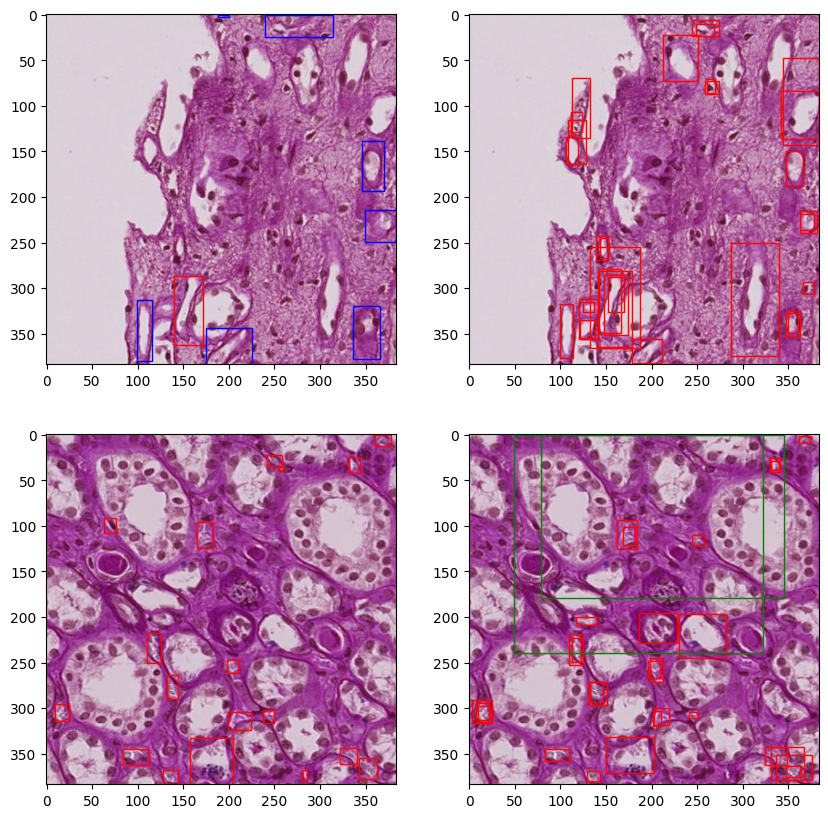

Epoch 2/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

  0%|          | 0/245 [00:00<?, ?batch/s]

mAP_50:  tensor(0.1670)


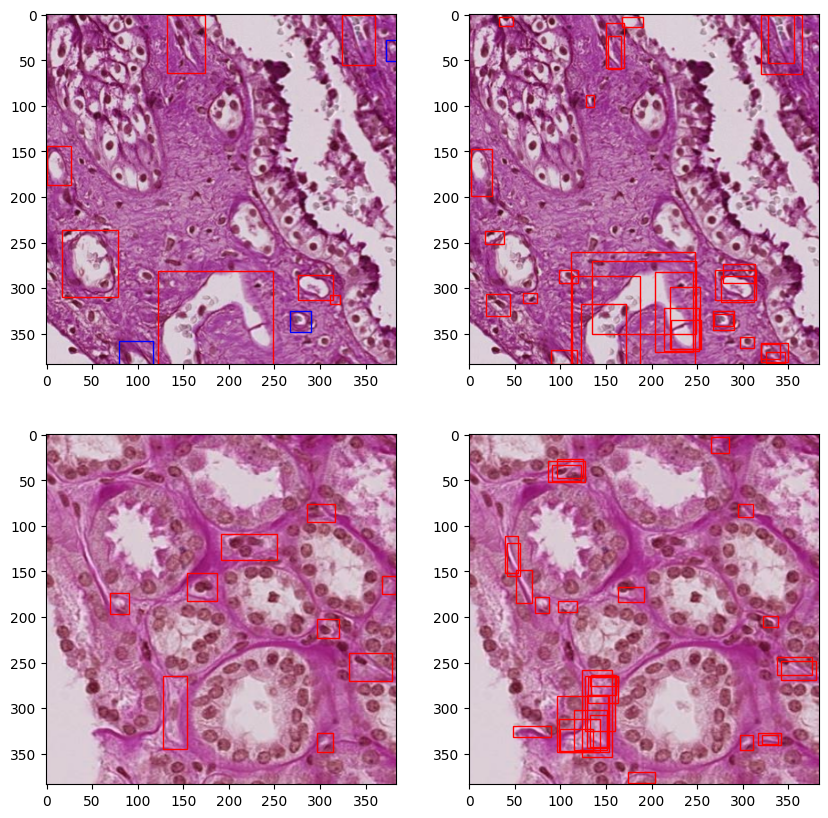

Epoch 3/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

  0%|          | 0/245 [00:00<?, ?batch/s]

mAP_50:  tensor(0.2095)


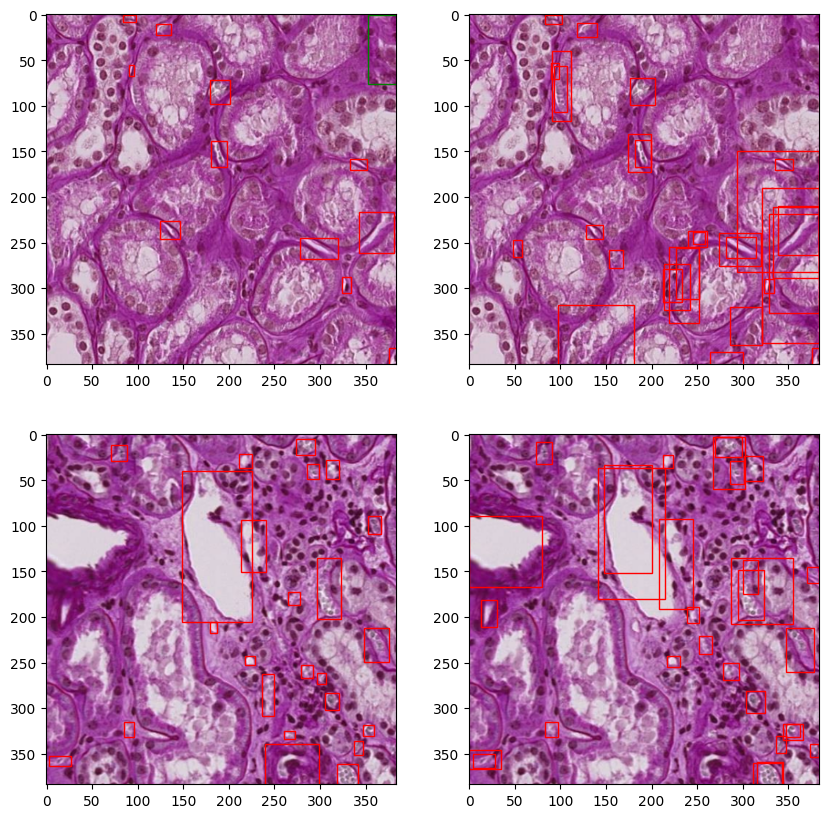

Epoch 4/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

  0%|          | 0/245 [00:00<?, ?batch/s]

mAP_50:  tensor(0.2563)


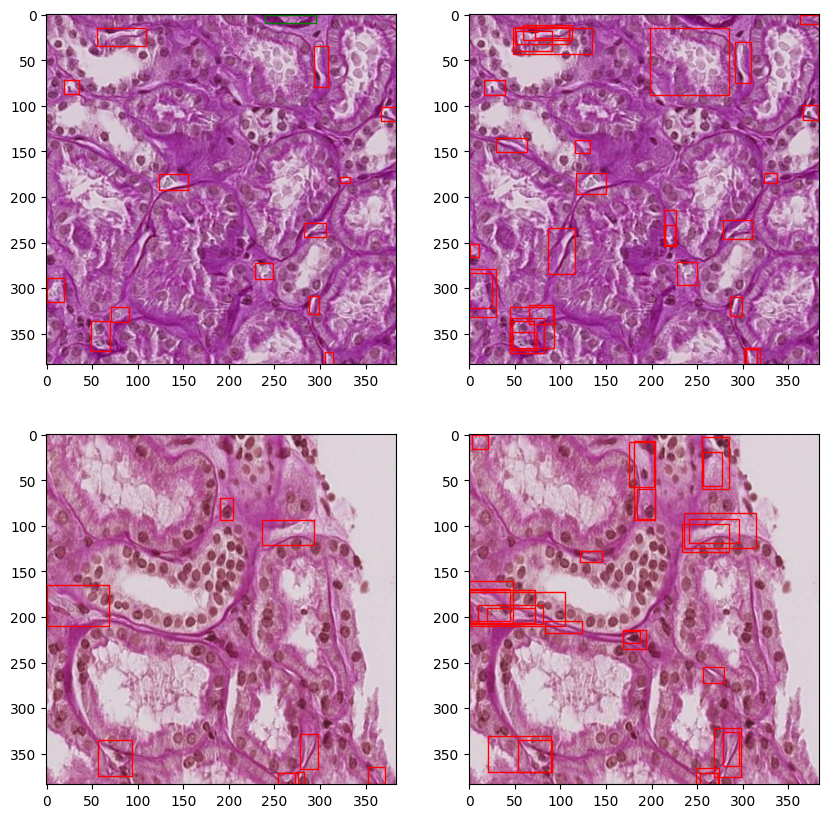

Epoch 5/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

  0%|          | 0/245 [00:00<?, ?batch/s]

mAP_50:  tensor(0.2636)


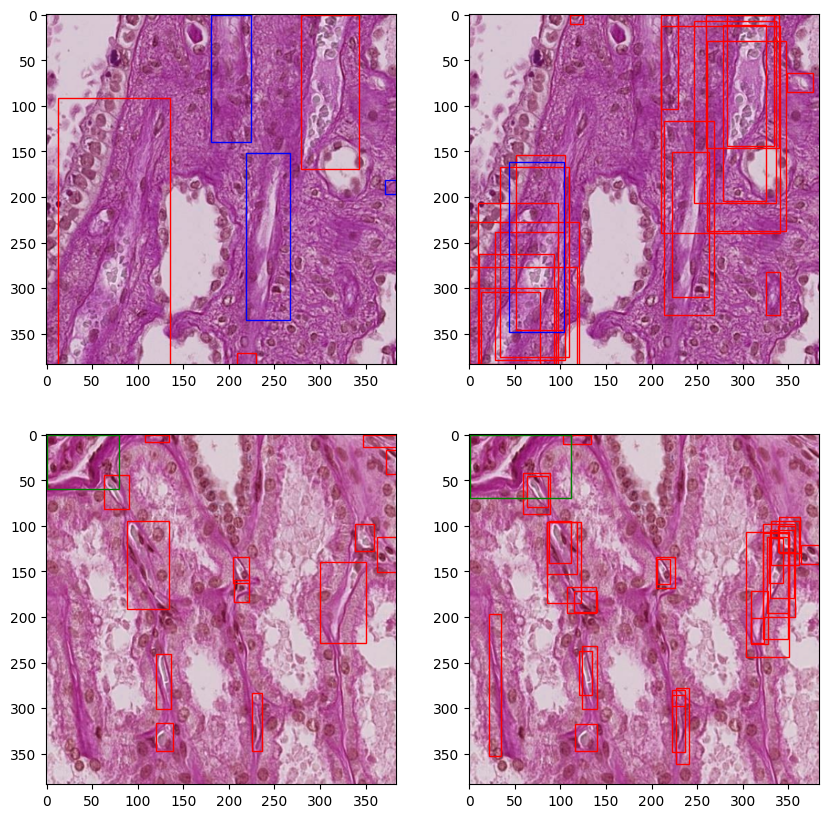

Epoch 6/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

  0%|          | 0/245 [00:00<?, ?batch/s]

mAP_50:  tensor(0.2682)


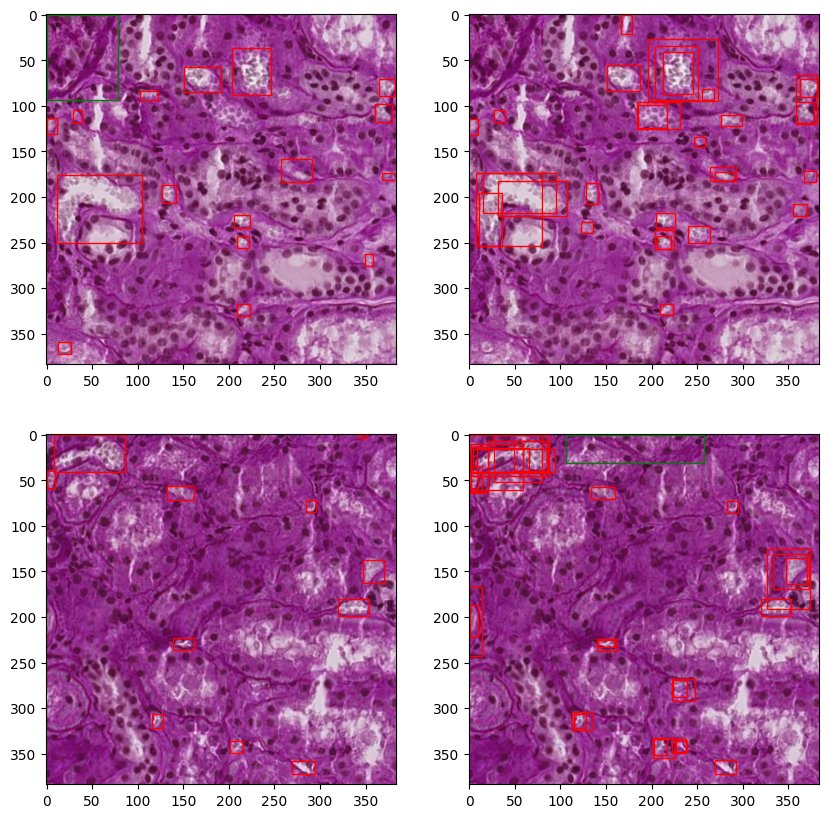

Epoch 7/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

  0%|          | 0/245 [00:00<?, ?batch/s]

mAP_50:  tensor(0.3023)


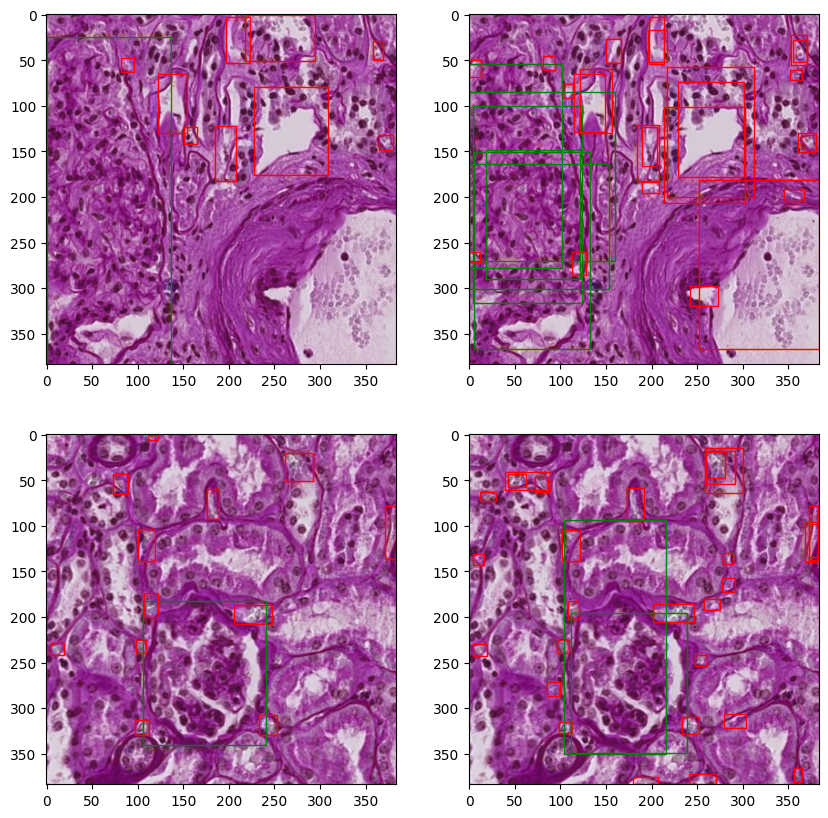

Epoch 8/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

  0%|          | 0/245 [00:00<?, ?batch/s]

mAP_50:  tensor(0.2835)


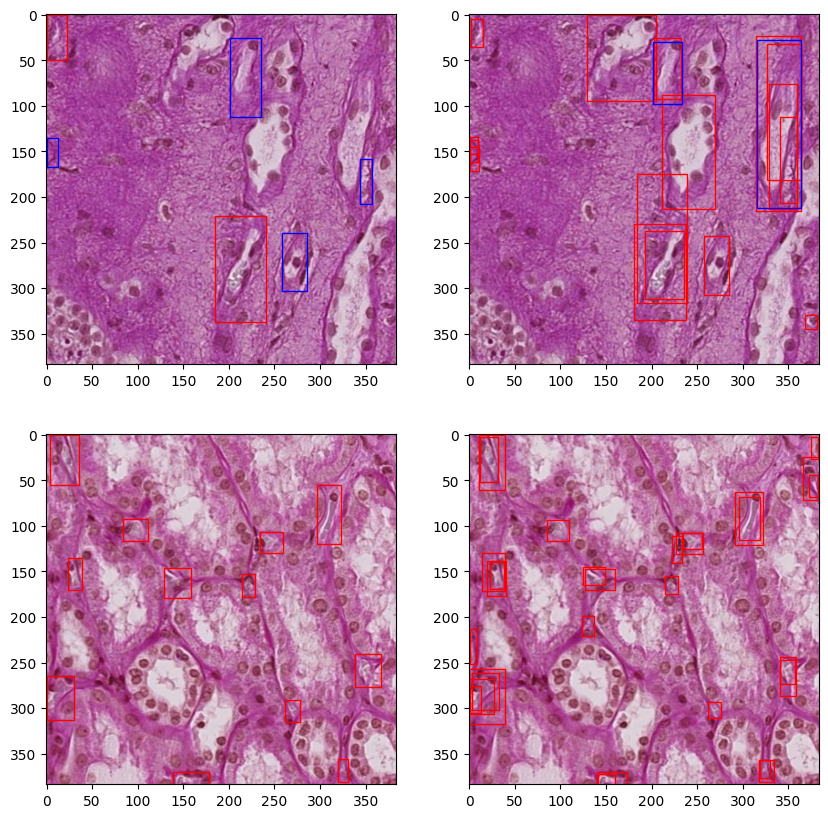

Epoch 9/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

  0%|          | 0/245 [00:00<?, ?batch/s]

mAP_50:  tensor(0.3120)


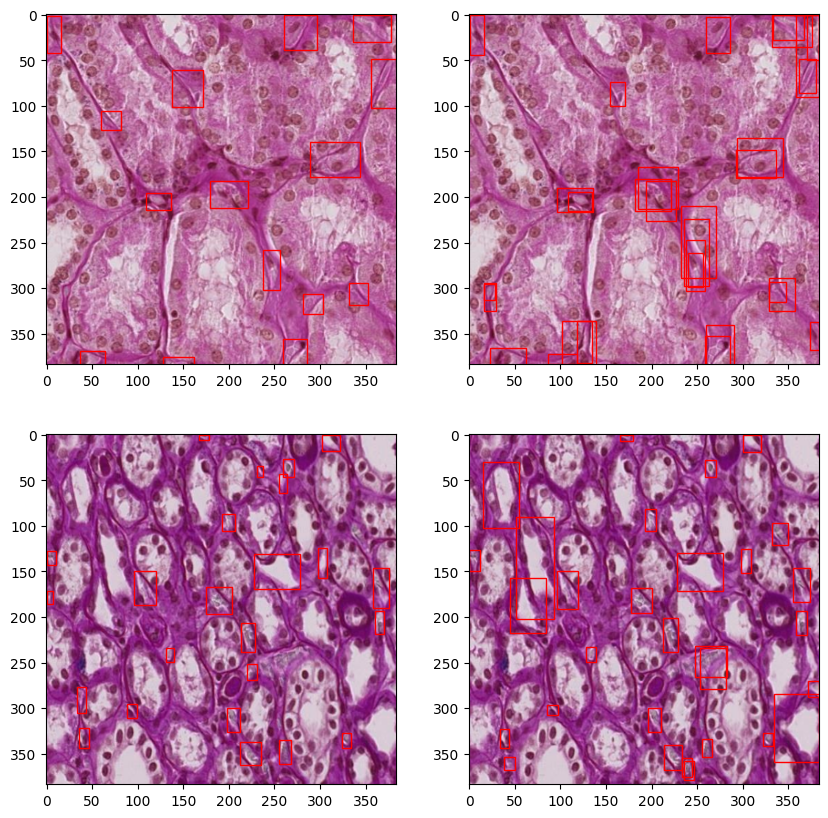

Epoch 10/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

  0%|          | 0/245 [00:00<?, ?batch/s]

mAP_50:  tensor(0.3140)


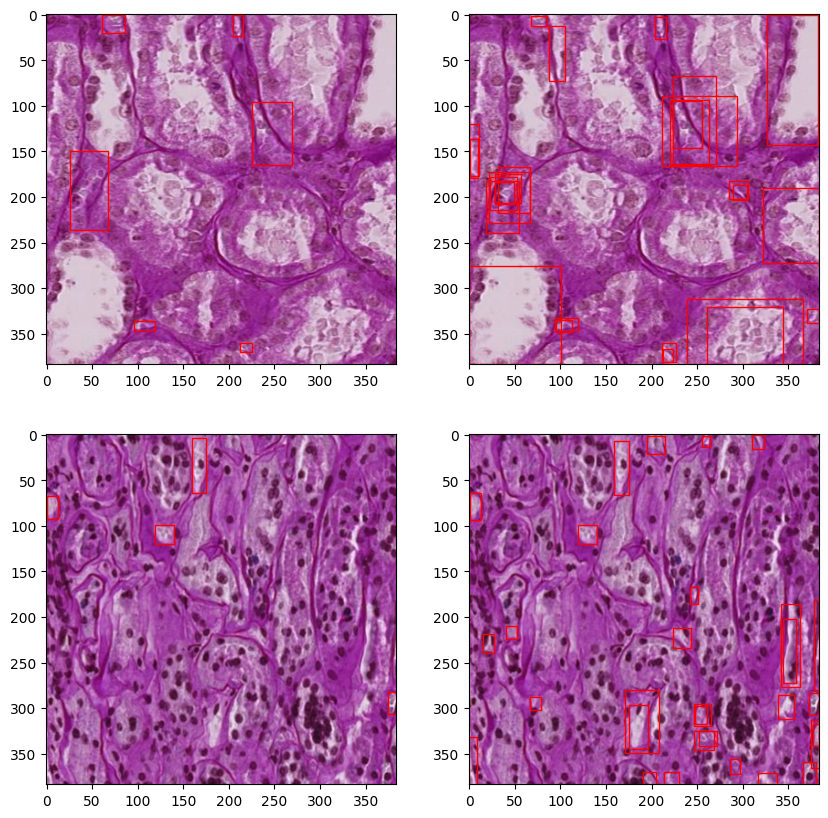

Epoch 11/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

  0%|          | 0/245 [00:00<?, ?batch/s]

mAP_50:  tensor(0.3302)


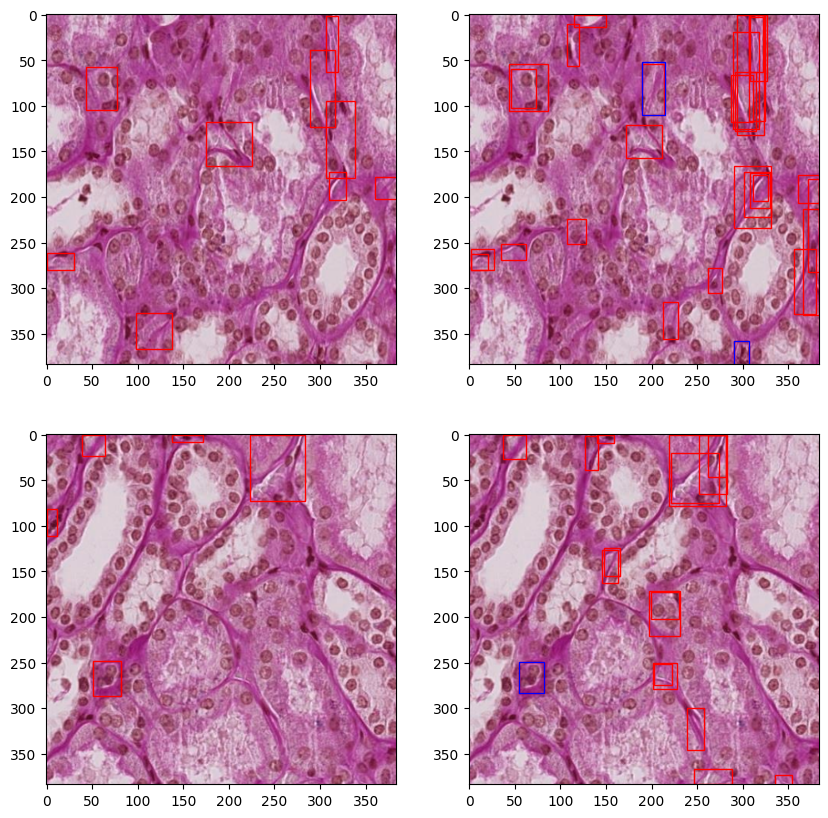

Epoch 12/30: 
1388


  0%|          | 0/1388 [00:00<?, ?batch/s]

In [ ]:
model = MFYTrain("YoloFormer", checkpoints=True,
                 checkpoint_interval=10, checkpoint_root= "/content/drive/MyDrive/Colab Notebooks/PDL")
model.train()